In [165]:
# Nombre: ________________________________________________ Grupo: BDIA. Fecha: 06/11/2025
#(0,25P)
# 1. Carga el archivo breast_cancer_wisconsin_diagnostic.csv en un dataframe de pandas.
# IMPORTANTE: Carga el archivo con los posibles valores que puedan identificarse como Nan (los señalados en práctica 1)
# a. Muestra su cabecera.
# b. Muestra las últimas filas del dataframe
# c. Dimensiones del dataframe: número de filas y columnas
# d. Nombres de las columnas en el formato lista 

In [181]:
# imports
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.decomposition import PCA

# 1)
df = pd.read_csv('breast_cancer_wisconsin_diagnostic.csv',
                 na_values=["?", "NA", "N/A", "None", "null", "nulo", ""],
                 sep=','
                )
# a)
print(df.head())
# b)
print(df.tail())
# c)
print(df.shape)
# d)
print(df.columns.tolist())

   mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
0        17.99         10.38          122.80     1001.0          0.11840   
1        20.57         17.77          132.90     1326.0          0.08474   
2        19.69         21.25          130.00     1203.0          0.10960   
3        11.42         20.38           77.58      386.1          0.14250   
4        20.29         14.34          135.10     1297.0          0.10030   

   mean compactness  mean concavity  mean concave points  mean symmetry  \
0           0.27760          0.3001              0.14710         0.2419   
1           0.07864          0.0869              0.07017         0.1812   
2           0.15990          0.1974              0.12790         0.2069   
3           0.28390          0.2414              0.10520         0.2597   
4           0.13280          0.1980              0.10430         0.1809   

   mean fractal dimension  ...  worst texture  worst perimeter  worst area  \
0             

In [167]:
#(0,25P)
# 2. Información sobre las variables del dataframe.
# a. Muestra las estadísticas básicas de las variables del dataframe. Observa el comportamiento de las variables: rangos, media, mediana, quantiles, etc.
# b. Muestra la distribución de las clases de la variable 'target'.
# c. Muestra información general del dataframe. Muestra nombre, tipo de variables, posibles valores nulos y uso de memoria.



In [168]:
# a)
print(df.describe())
# b)
print(df['target'].value_counts())
# c)
print(df.info())

       mean radius  mean texture  mean perimeter    mean area  \
count   559.000000    559.000000      569.000000   569.000000   
mean     14.129873     19.273936       91.969033   654.889104   
std       3.542317      4.287425       24.298981   351.914129   
min       6.981000      9.710000       43.790000   143.500000   
25%      11.685000     16.175000       75.170000   420.300000   
50%      13.380000     18.840000       86.240000   551.100000   
75%      15.935000     21.790000      104.100000   782.700000   
max      28.110000     39.280000      188.500000  2501.000000   

       mean smoothness  mean compactness  mean concavity  mean concave points  \
count       569.000000        569.000000      569.000000           569.000000   
mean          0.096360          0.104341        0.088799             0.048919   
std           0.014064          0.052813        0.079720             0.038803   
min           0.052630          0.019380        0.000000             0.000000   
25%      

mean radius                10
mean texture               10
target                     10
mean area                   0
mean smoothness             0
mean compactness            0
mean perimeter              0
mean concave points         0
mean symmetry               0
mean fractal dimension      0
radius error                0
texture error               0
perimeter error             0
area error                  0
mean concavity              0
smoothness error            0
compactness error           0
concave points error        0
concavity error             0
fractal dimension error     0
worst radius                0
worst texture               0
symmetry error              0
worst perimeter             0
worst area                  0
worst compactness           0
worst smoothness            0
worst concavity             0
worst concave points        0
worst symmetry              0
worst fractal dimension     0
dtype: int64


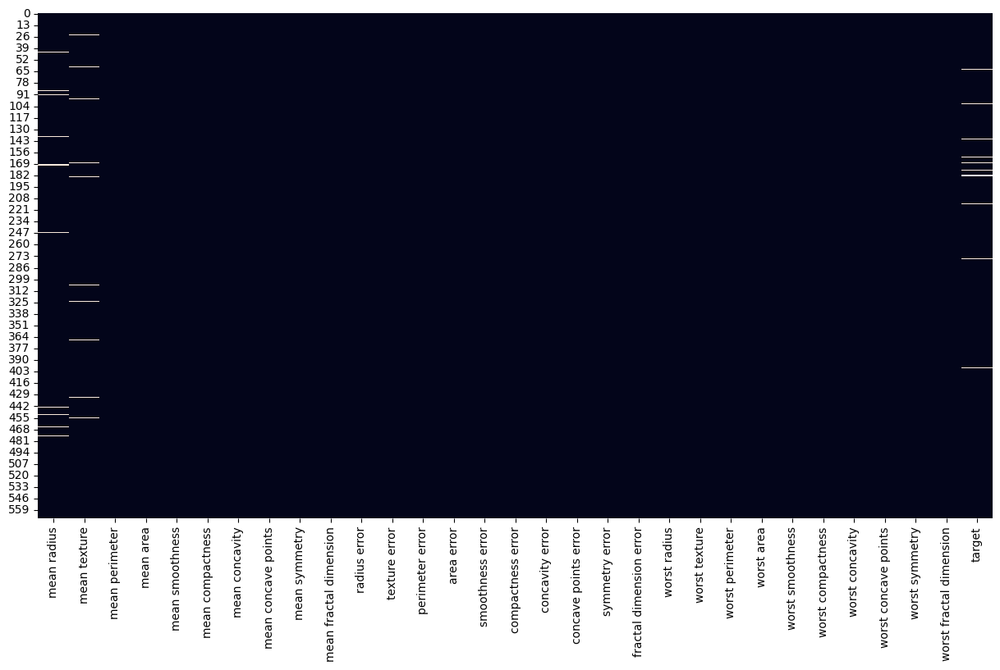


Valores faltantes después de la imputación:
0


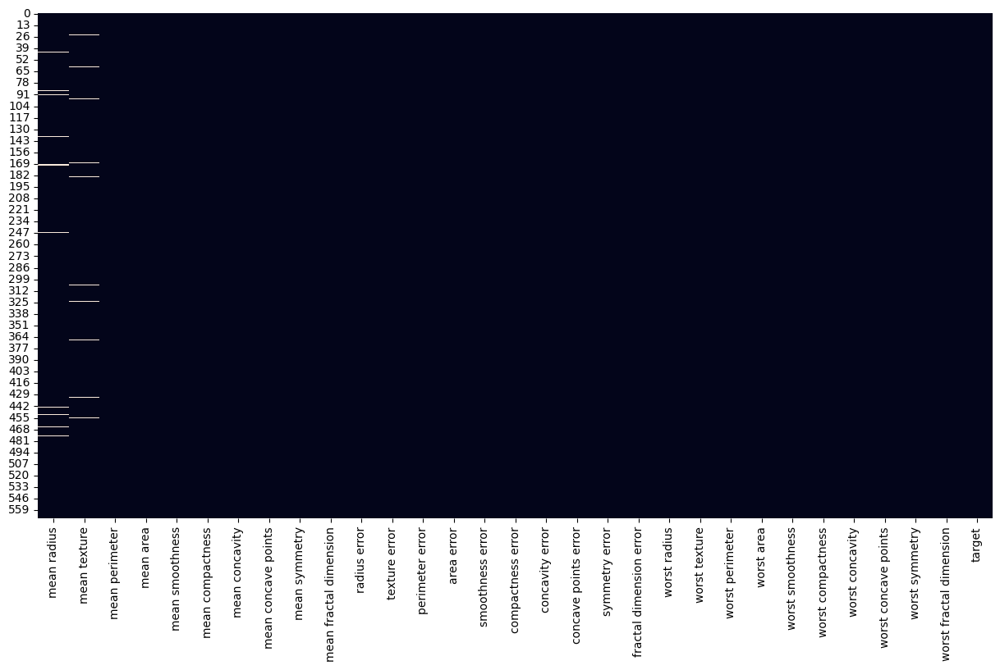

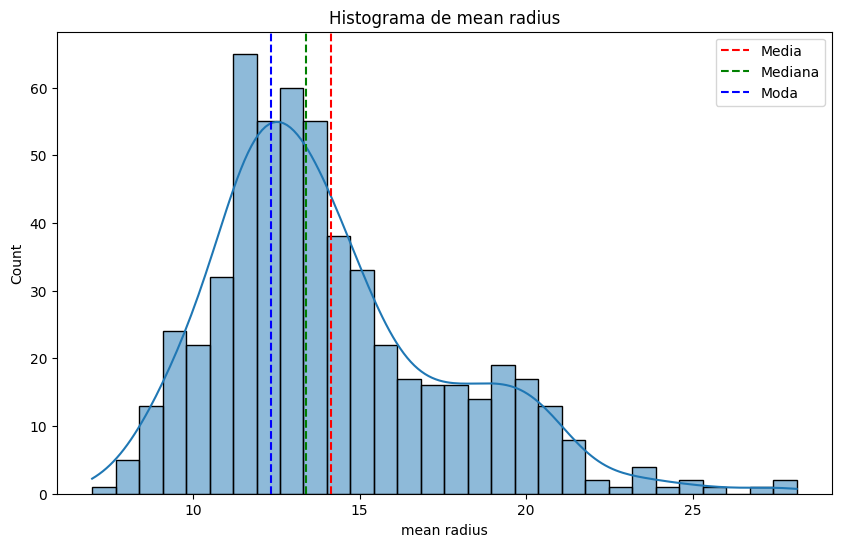

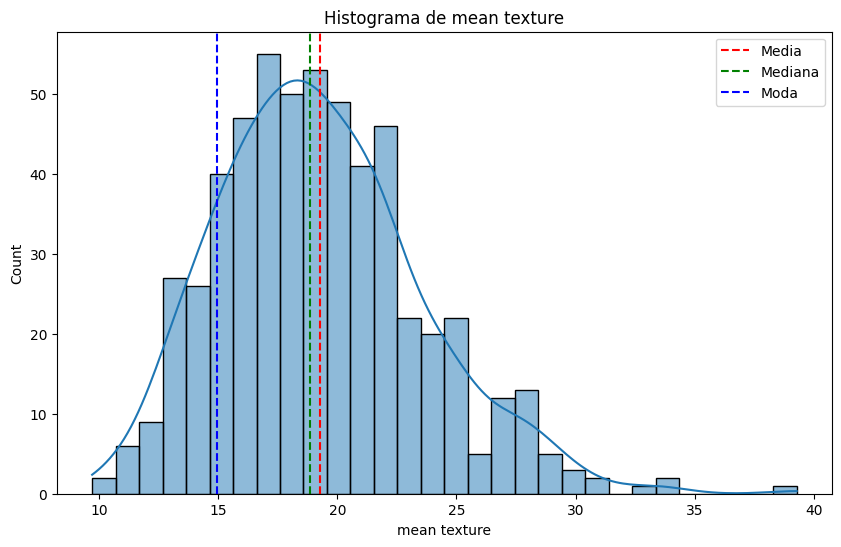

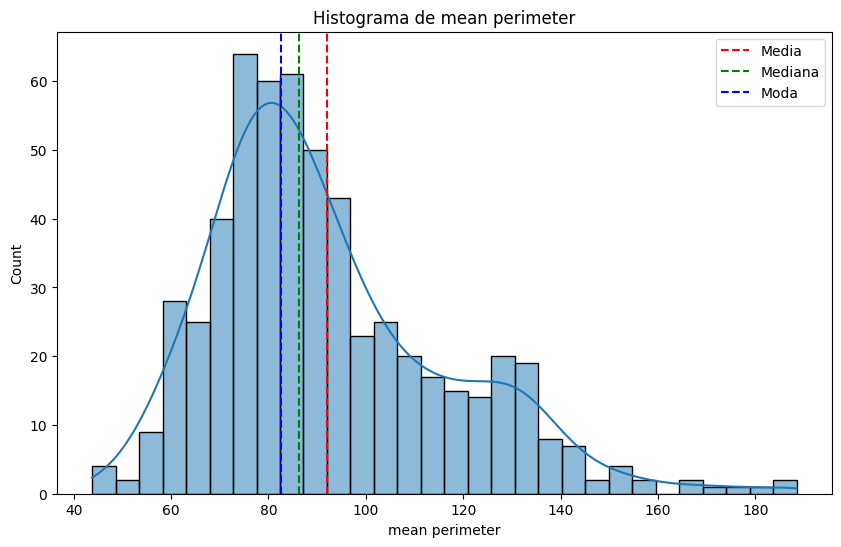

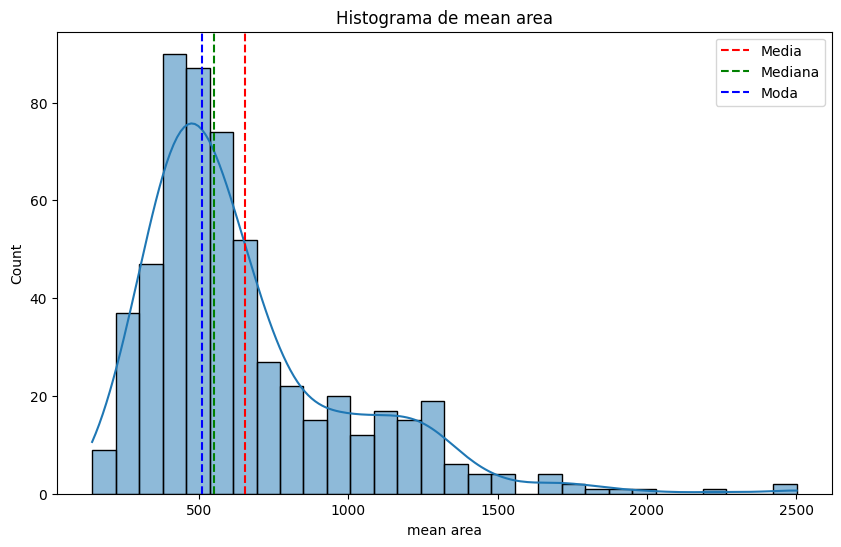

...

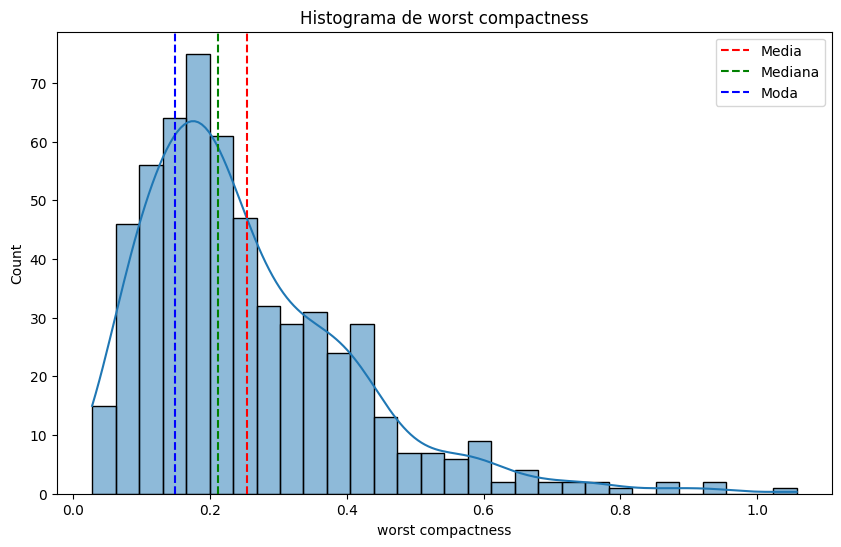

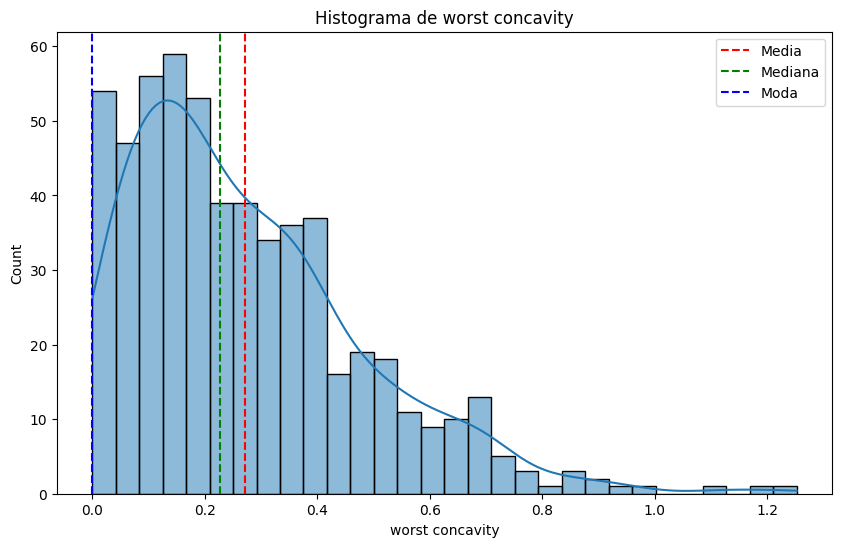

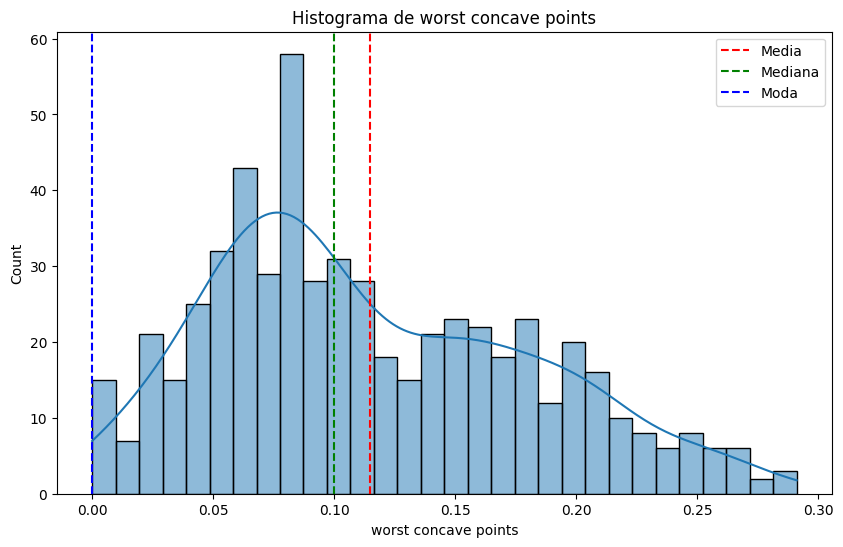

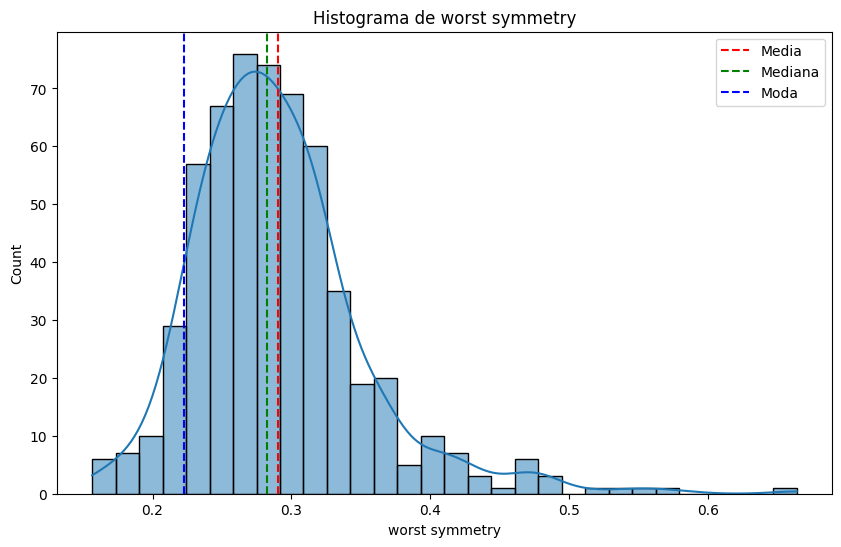

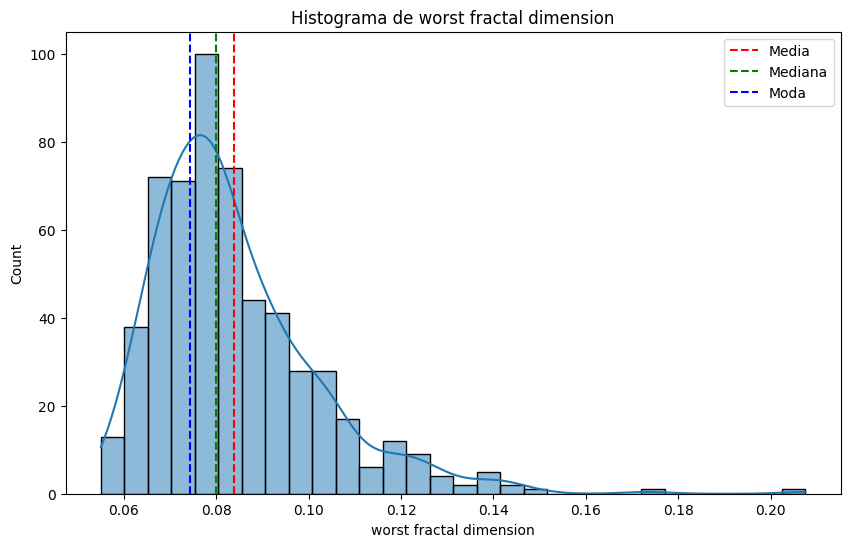

In [169]:
#(1P)
# 3. Tratamiento de outliers y Nans.
# a. Identifica y muestra numéricamente los valores NaN de este dataset en orden descendente.
print(df.isna().sum().sort_values(ascending=False))
# b. Muestra gráficamente estos valores nulos mediante un mapa de calor.
plt.subplots(figsize=(15,8))
sns.heatmap(df.isnull(), cbar=False)
plt.show()
# c. Imputar outilers de la variable categórica 'target' con la moda. Verifica que se ha llevado a cabo la imputación de forma numérica y grafica.
moda = df['target'].mode()[0]
df['target'] = df['target'].fillna(moda)
print("\nValores faltantes después de la imputación:")
print(df['target'].isna().sum())
plt.subplots(figsize=(15,8))
sns.heatmap(df.isnull(), cbar=False)
plt.show()
# d. Construye una función que, dado un dataframe y una cadena con el nombre de una variable, muestre un histograma de una variable predictora,
#    y líneas de colores para representar la media, la mediana y la moda.Toma nota de las posibles asimetrías de las variables.
def histograma(df, nombre_columna):
    plt.figure(figsize=(10, 6))
    sns.histplot(df[nombre_columna], bins=30, kde=True)
    plt.axvline(df[nombre_columna].mean(), color='r', linestyle='--', label='Media')
    plt.axvline(df[nombre_columna].median(), color='g', linestyle='--', label='Mediana')
    plt.axvline(df[nombre_columna].mode()[0], color='b', linestyle='--', label='Moda')
    plt.title(f'Histograma de {nombre_columna}')
    plt.legend()
    plt.show()
# e. Utilizando la función anterior muestra, mediante u bucle for, los histogramas de todas las variables predictoras del dataset.
variables_predictoras = [col for col in df.columns if col != 'target']
for var in variables_predictoras:
    histograma(df, var)

In [170]:
#(0,5P)
# 4. Asimetría.
# a. Calcula el coeficiente de simetría (Skew) de las variables predictoras del DataFrame.
asimetría = df.skew()
asimetría
# b. Realiza una tabla, como la mostrada en la celda con título: Asimetría (Skewness) en un DataFrame, con el correspondiente análisis de variables.

mean radius                0.937905
mean texture               0.643962
mean perimeter             0.990650
mean area                  1.645732
mean smoothness            0.456324
mean compactness           1.190123
mean concavity             1.401180
mean concave points        1.171180
mean symmetry              0.725609
mean fractal dimension     1.304489
radius error               3.088612
texture error              1.646444
perimeter error            3.443615
area error                 5.447186
smoothness error           2.314450
compactness error          1.902221
concavity error            5.110463
concave points error       1.444678
symmetry error             2.195133
fractal dimension error    3.923969
worst radius               1.103115
worst texture              0.498321
worst perimeter            1.128164
worst area                 1.859373
worst smoothness           0.415426
worst compactness          1.473555
worst concavity            1.150237
worst concave points       0

# fractal dimension error - 3.923969 - Positiva fuerte
# worst texture - 0.498321 - Casi simétrica
# target - -0.575652 - Negativa

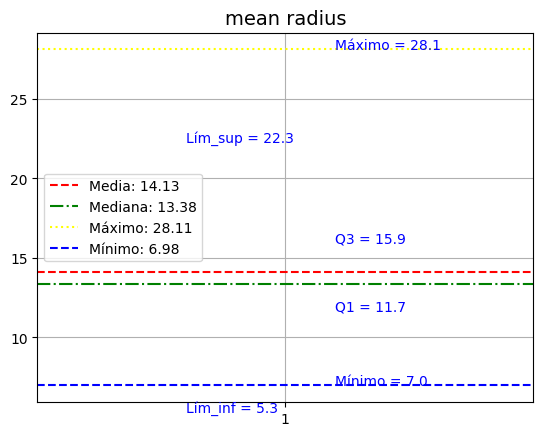

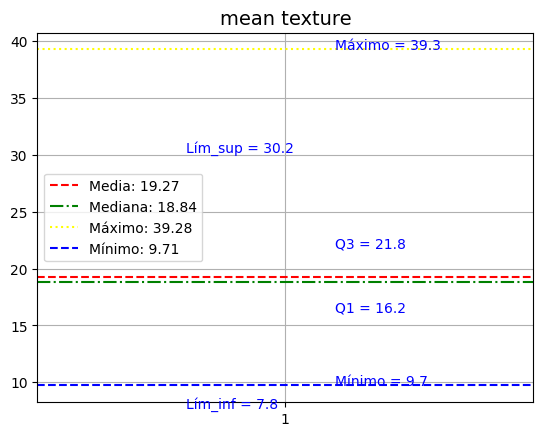

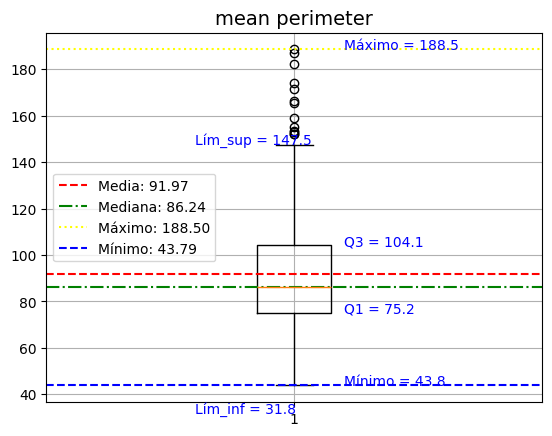

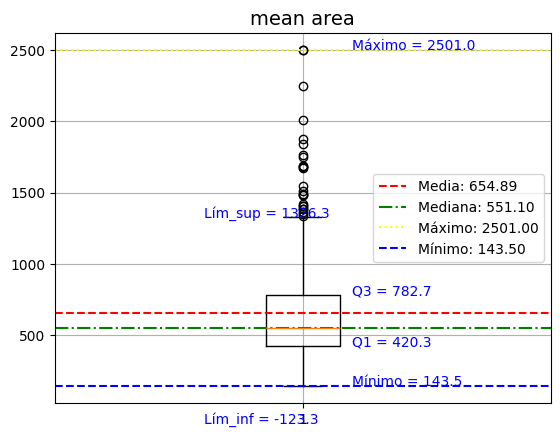

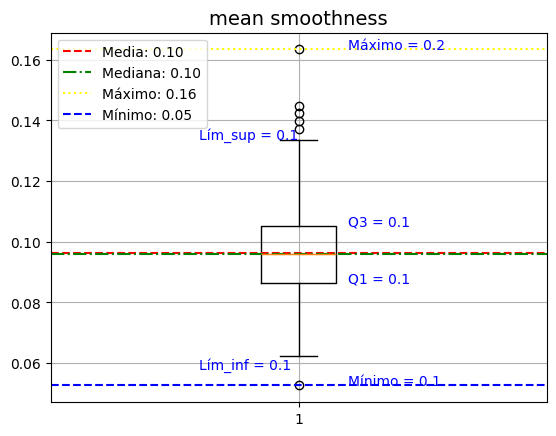

...

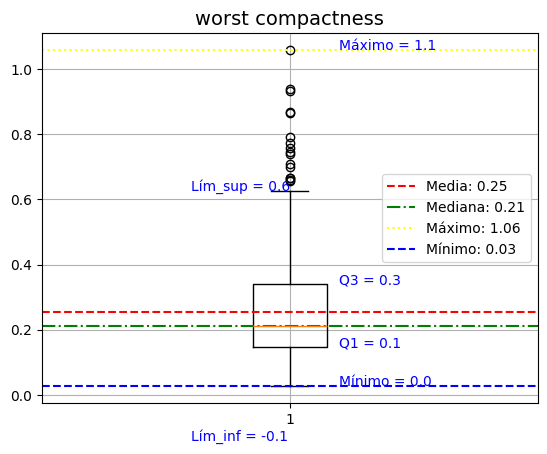

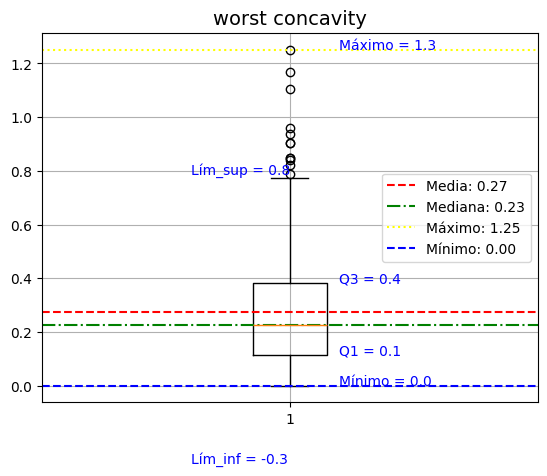

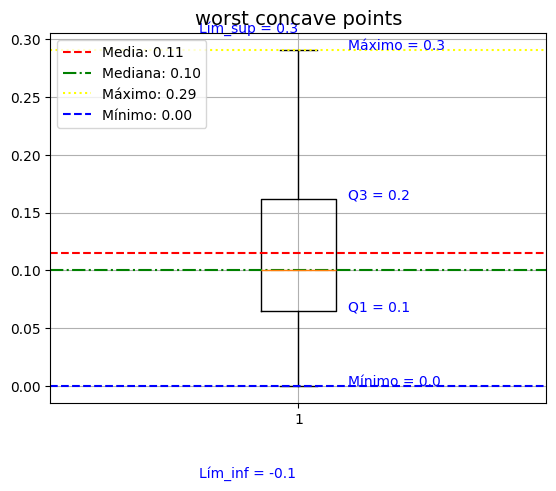

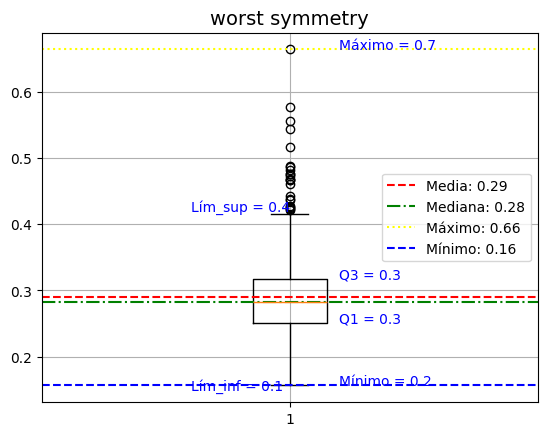

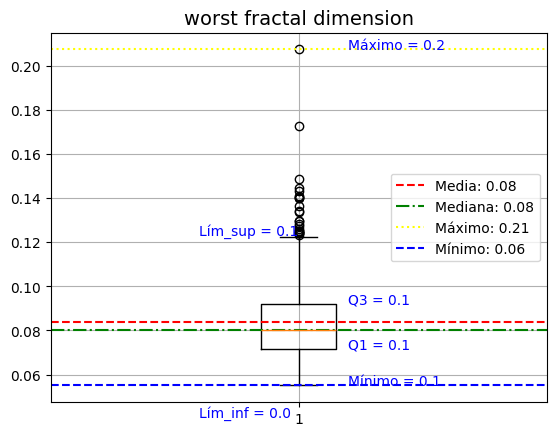

In [171]:
#(1P)
# 5. Boxplot y outliers.
# a. Construye una función que, dado un dataframe y una cadena con el nombre de una variable predictora, 
#    muestre el boxplot de la variable predictora, su media, mediana, máximo y mínimo.
def boxplot(dataframe, var_pred):
    plt.boxplot(dataframe[var_pred])

    # Título y etiquetas
    plt.title(f'{var_pred}', fontsize=14)
    plt.ylabel('')

    # Cálculo de estadísticas
    Q1 = dataframe[var_pred].quantile(0.25) #primer cuartil
    Q3 = dataframe[var_pred].quantile(0.75) #tercer cuartil
    median = dataframe[var_pred].median() #Calcula la mediana de la distribución de valores
    mean = dataframe[var_pred].mean() #Calcula el valor medio de la distribución de valores
    max = dataframe[var_pred].max() # máximo de la distribución de valores
    min = dataframe[var_pred].min() # mínimo de la distribución de valores
    # Líneas de referencia
    plt.axhline(mean, color='red', linestyle='--', label=f'Media: {mean:.2f}')
    plt.axhline(median, color='green', linestyle='-.', label=f'Mediana: {median:.2f}')
    plt.axhline(max, color='yellow', linestyle=':', label=f'Máximo: {max:.2f}')
    plt.axhline(min, color='blue', linestyle='--', label=f'Mínimo: {min:.2f}')

    # Leyenda cuartiles
    plt.text(1.1, Q1, f'Q1 = {Q1:.1f}', color='blue') #Posición leyenda Q1 en (1.1, Q1)
    plt.text(1.1, Q3, f'Q3 = {Q3:.1f}', color='blue') #Posición leyenda Q3 en (1.1, Q3)

    # Leyenda Máximo y mínimo
    plt.text(1.1, max, f'Máximo = {max:.1f}', color='blue') #Posición leyenda max en (1.1, max)
    plt.text(1.1, min, f'Mínimo = {min:.1f}', color='blue') #Posición leyenda min en (1.1, max)

    #Cálculo límites superior e inferior
    IRQ = Q3 - Q1
    lim_sup = Q3 + 1.5 * IRQ
    lim_inf = Q1 - 1.5 * IRQ
    plt.text(0.8, lim_sup, f'Lím_sup = {lim_sup:.1f}', color='blue') #Posición leyenda lim_sup en (0.8, lim_sup)
    plt.text(0.8, lim_inf, f'Lím_inf = {lim_inf:.1f}', color='blue') #Posición leyenda lim_inf en (0.8, lim_inf)

    # Mostrar leyenda
    plt.legend()
    plt.grid(True)
    plt.show()
# b. Utilizando esta función, muestra  -mediante un bucle for- todos los boxplots correspondientes a las variables predictoras.
for var in variables_predictoras:
    boxplot(df, var)

In [187]:
#(1P)
# 6. Imputación de variables predictoras.
# a. Construye una función que, dado un dataframe y una cadena con el nombre de una variable predictora, devuelva el número de sus valores faltantes.
#    Muéstralos para todas las variables mediante un bucle for reutilizando la función anterior.
def cont_NaNs(dataframe, var_pred):
    valores_faltantes = dataframe[var_pred].isna().sum()
    return valores_faltantes

for var in variables_predictoras:
    print(f"Nulos de {var}: {cont_NaNs(df, var)}")
# b. Imputa los valores faltantes de mean radius mediante la media y los valores faltantes de mean texture mediante la mediana.
media = df['mean radius'].mean()
mediana = df['mean texture'].median()
df['mean radius'] = df['mean radius'].fillna(media)
df['mean texture'] = df['mean texture'].fillna(mediana)

Nulos de mean radius: 10
Nulos de mean texture: 10
Nulos de mean perimeter: 0
Nulos de mean area: 0
Nulos de mean smoothness: 0
Nulos de mean compactness: 0
Nulos de mean concavity: 0
Nulos de mean concave points: 0
Nulos de mean symmetry: 0
Nulos de mean fractal dimension: 0
Nulos de radius error: 0
Nulos de texture error: 0
Nulos de perimeter error: 0
Nulos de area error: 0
Nulos de smoothness error: 0
Nulos de compactness error: 0
Nulos de concavity error: 0
Nulos de concave points error: 0
Nulos de symmetry error: 0
Nulos de fractal dimension error: 0
Nulos de worst radius: 0
Nulos de worst texture: 0
Nulos de worst perimeter: 0
Nulos de worst area: 0
Nulos de worst smoothness: 0
Nulos de worst compactness: 0
Nulos de worst concavity: 0
Nulos de worst concave points: 0
Nulos de worst symmetry: 0
Nulos de worst fractal dimension: 0


In [173]:
#(0,5P)
# 7. Correlación entre variables
# a. Muestra las correlaciones entre las variables del dataset, de forma numérica y gráfica mediante un diagrama de calor.
correlacion = df.corr()
correlacion
# b. Realiza la tabla que se encuentra en el cuaderno práctica1, donde se muestra un análisis de la correlación entre las variables del dataset.
#    En base a esta información, ¿puedes eliminar alguna variable predictora? Justifica tu respuesta.

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
mean radius,1.000000,0.321047,0.997855,0.987350,0.167962,0.507004,0.675629,0.822678,0.154012,-0.312416,...,0.294878,0.965806,0.941414,0.115452,0.417397,0.528352,0.744975,0.167679,0.010143,-0.724092
mean texture,0.321047,1.000000,0.330427,0.322253,-0.021144,0.238646,0.305131,0.294551,0.083008,-0.073530,...,0.910526,0.358975,0.344469,0.080516,0.280707,0.305345,0.297085,0.110863,0.120781,-0.418560
mean perimeter,0.997855,0.330427,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019,-0.734140
mean area,0.987350,0.322253,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738,-0.702363
mean smoothness,0.167962,-0.021144,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316,-0.359063
mean compactness,0.507004,0.238646,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382,-0.587257
mean concavity,0.675629,0.305131,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930,-0.687352
mean concave points,0.822678,0.294551,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661,-0.765276
mean symmetry,0.154012,0.083008,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413,-0.331530
mean fractal dimension,-0.312416,-0.073530,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297,0.009724


# worst texture - mean radius | 0.294878 | Positiva débil
# worst compactness - mean radius | 0.417397 | Positiva moderada
# worst concave points - mean radius | 0.744975 | Positiva fuerte

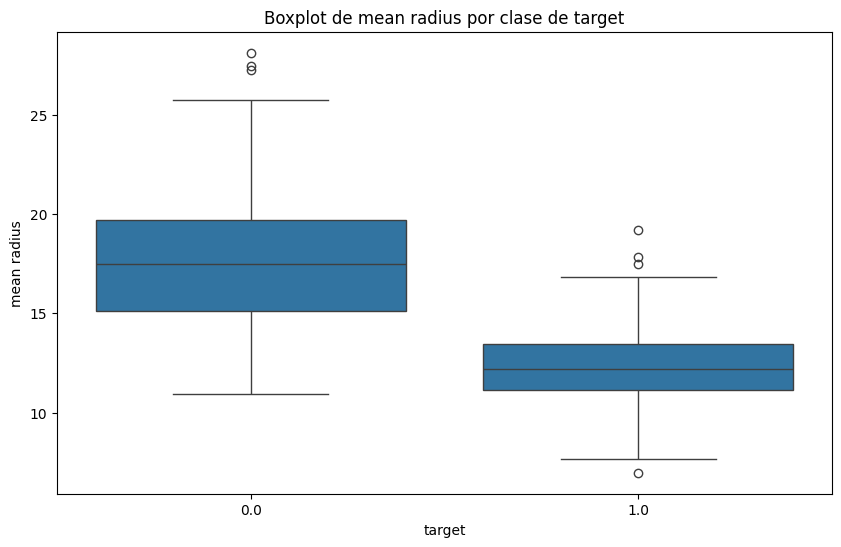

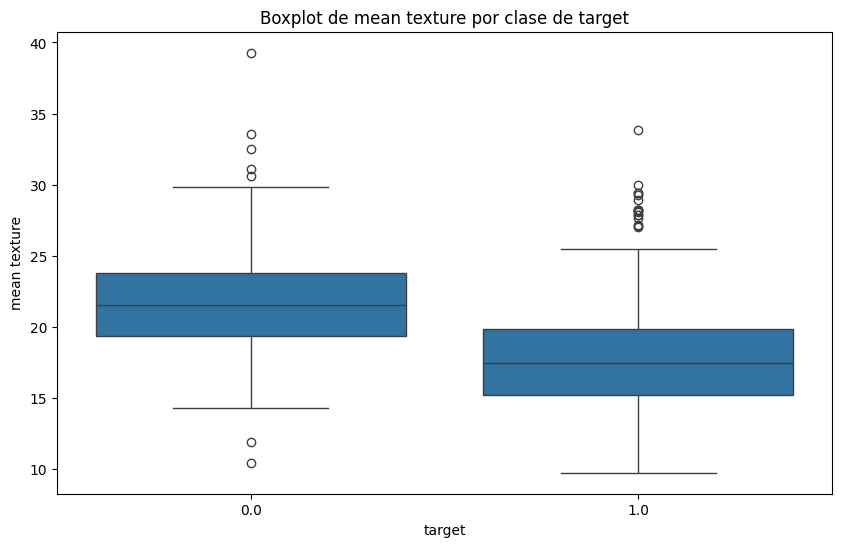

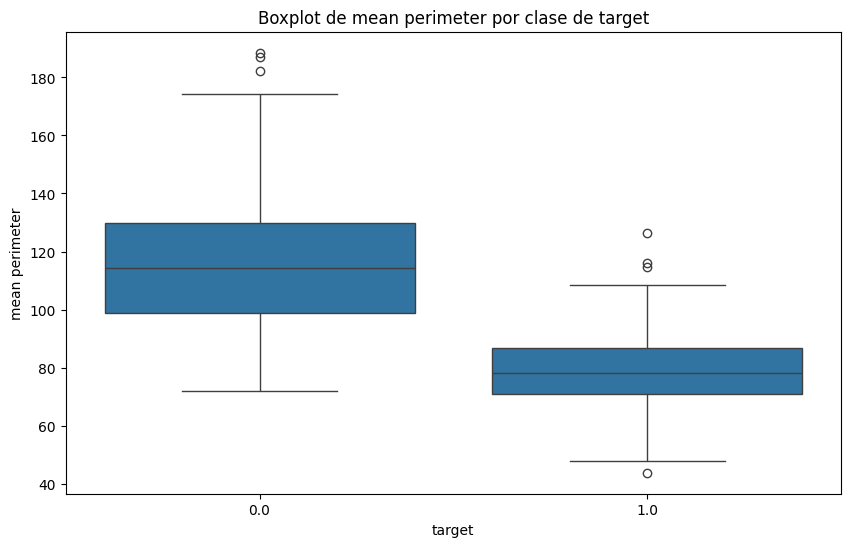

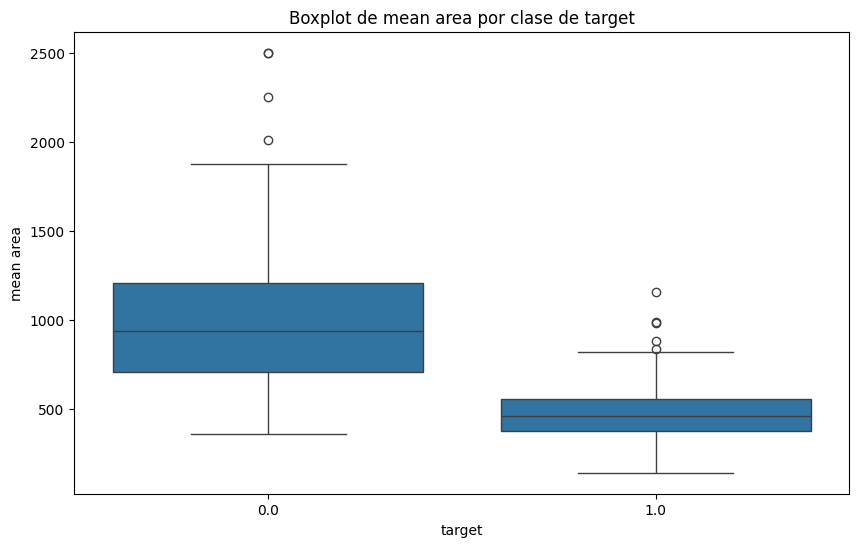

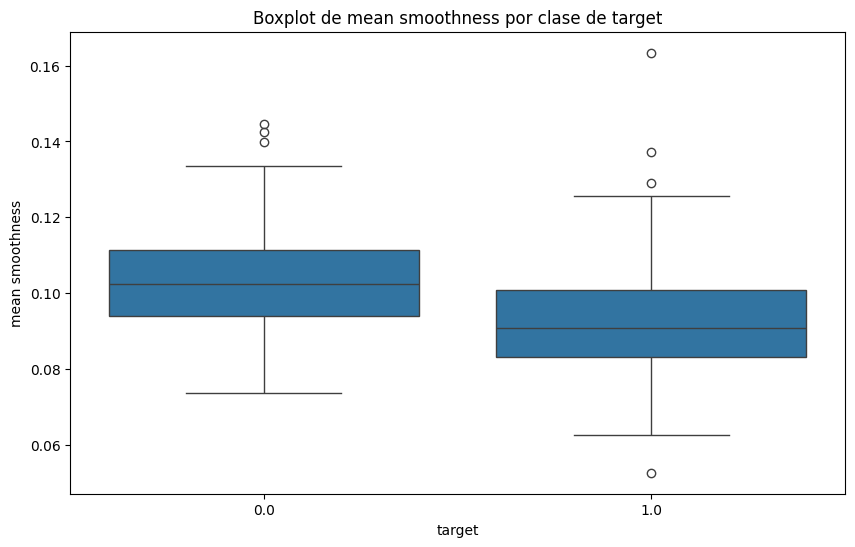

...

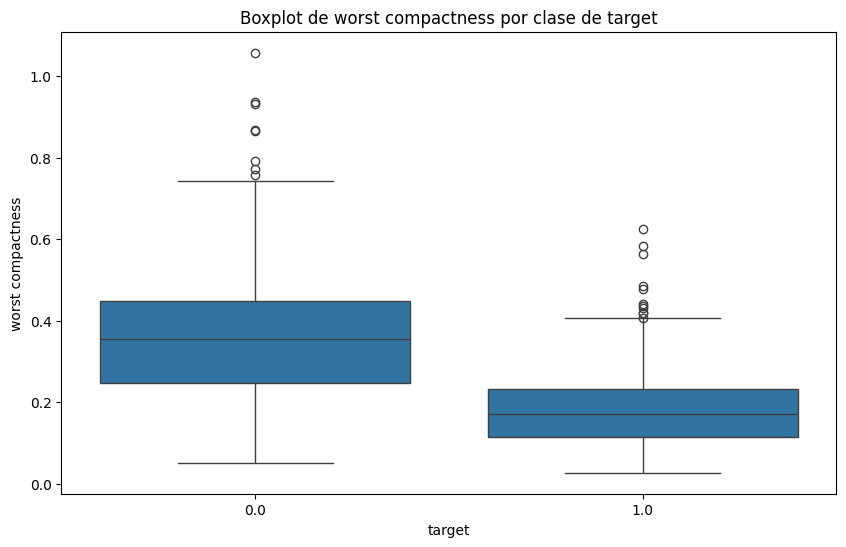

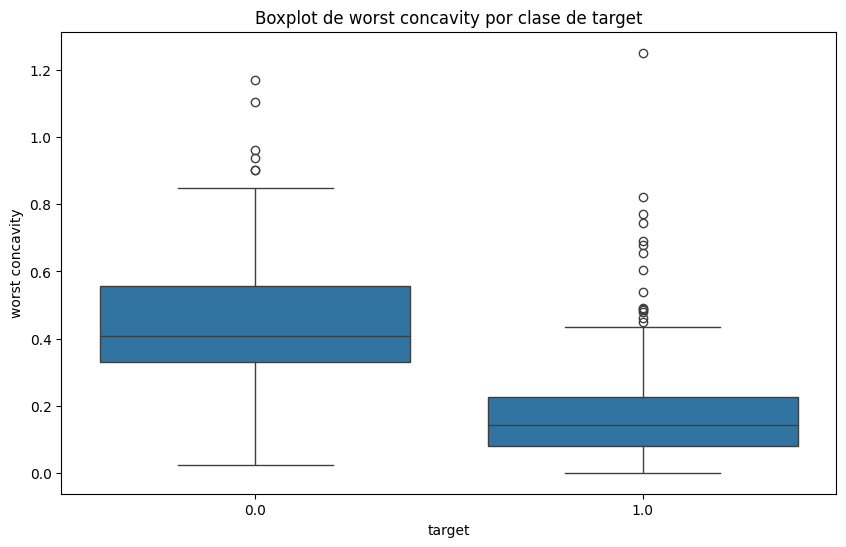

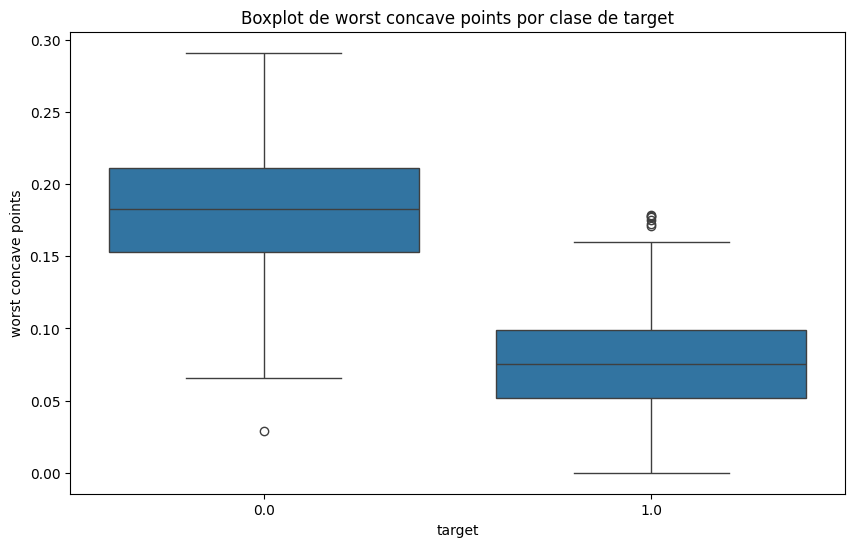

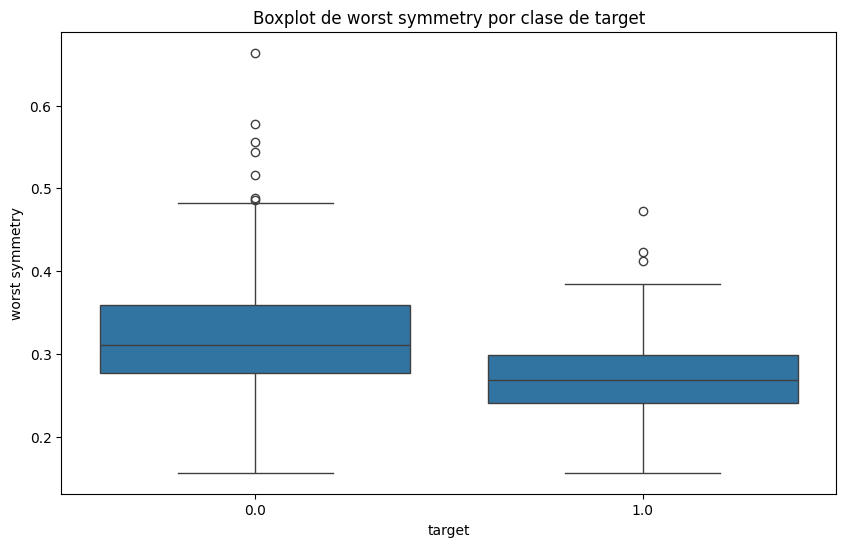

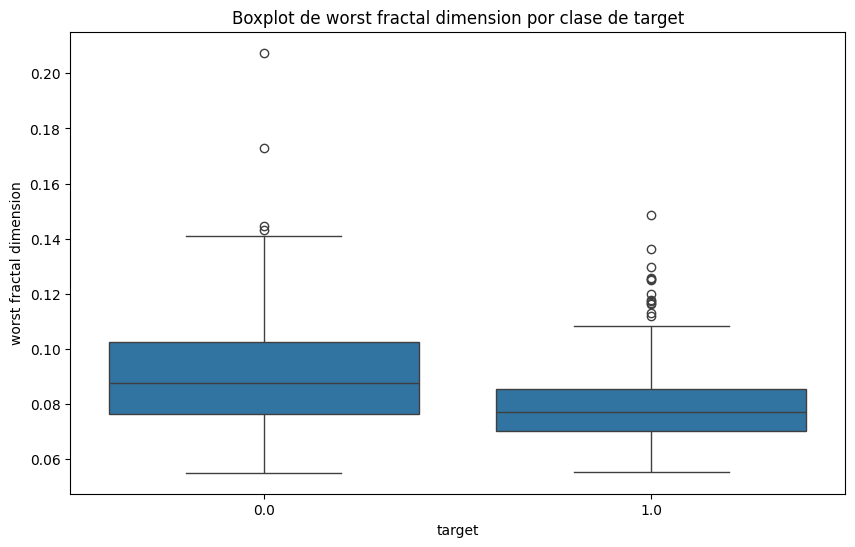

In [174]:
#(1P)
# 8. Gráficos y análisis de distribución de variables por clase. Boxplots.
# a. Construye una función que, dado un dataframe, una cadena con el nombre de una variable predictora y una cadena con la variable objetivo
#    muestre el boxplot de la variable predictora para cada valor de clase.
def boxplot_por_clase(dataframe, nombre_variable, nombre_objetivo):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=nombre_objetivo, y=nombre_variable, data=dataframe)
    plt.title(f'Boxplot de {nombre_variable} por clase de {nombre_objetivo}')
    plt.xlabel(nombre_objetivo)
    plt.ylabel(nombre_variable)
    plt.show() 
# b. Utilizando esta función, muestra  -mediante un bucle for- todos los boxplots por clase, correspondientes a las variables predictoras.
for var in variables_predictoras:
    boxplot_por_clase(df, var, "target")
# c. Con base a las gráficas anteriores, ¿qué conclusiones puedes extraer?

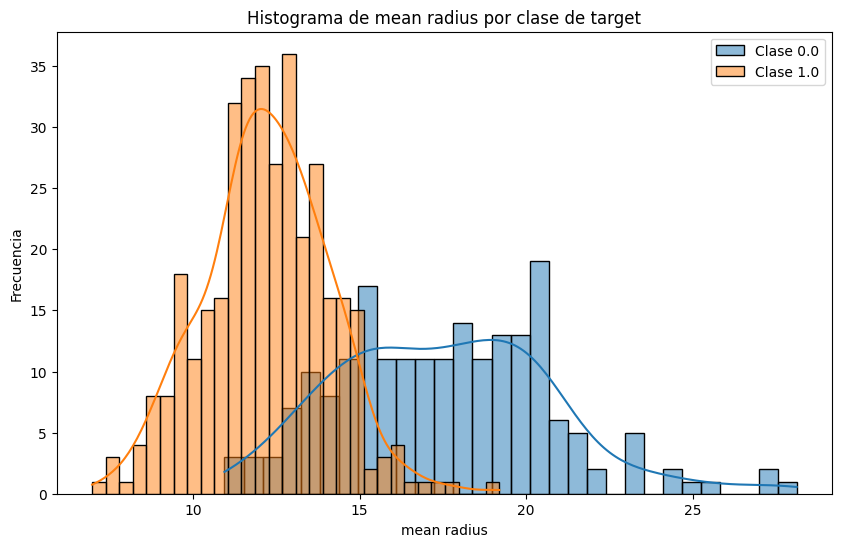

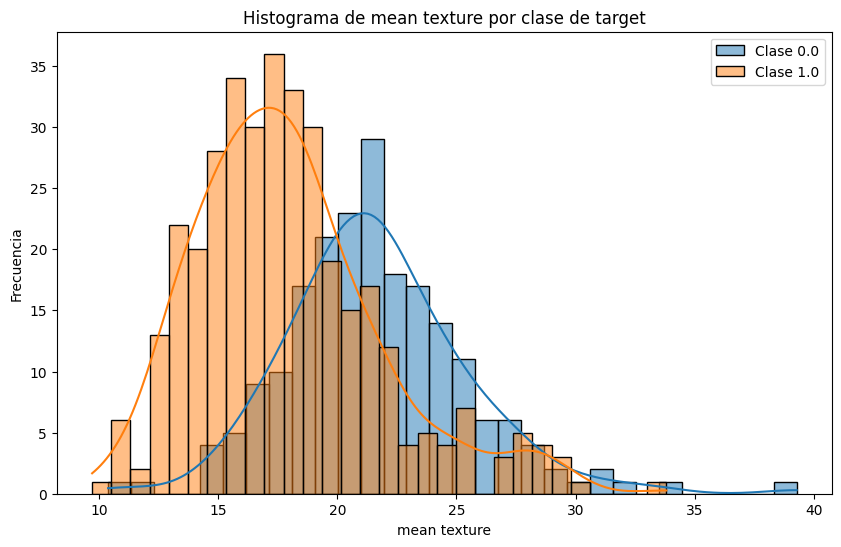

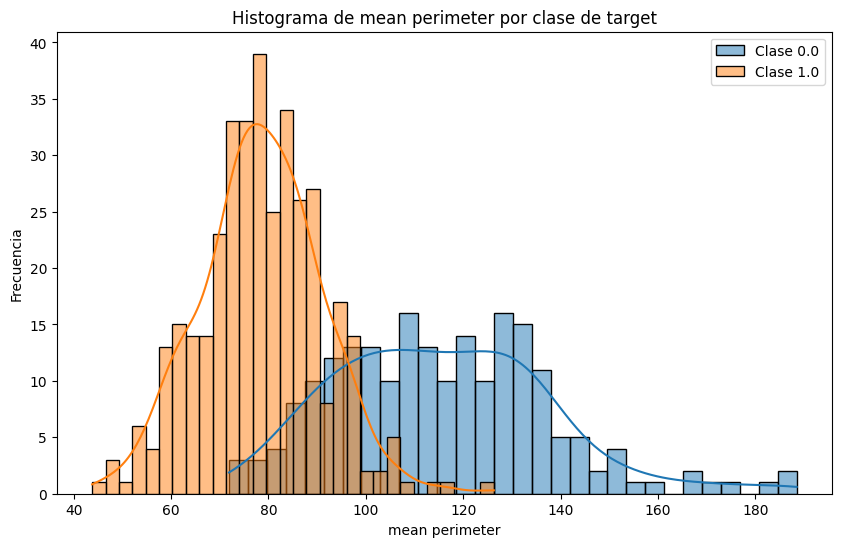

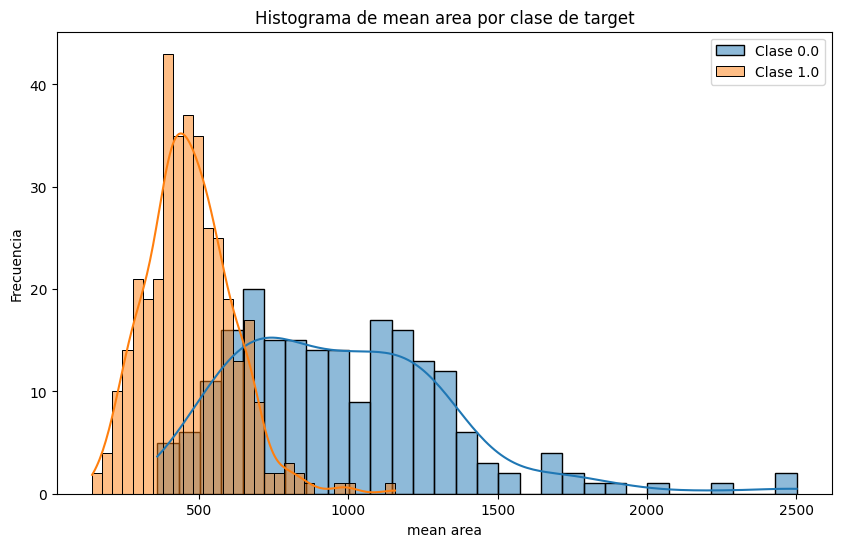

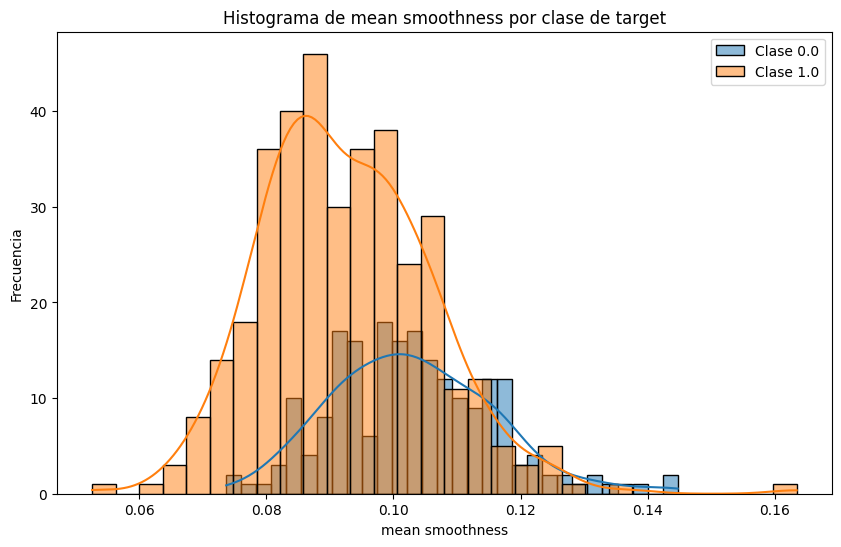

...

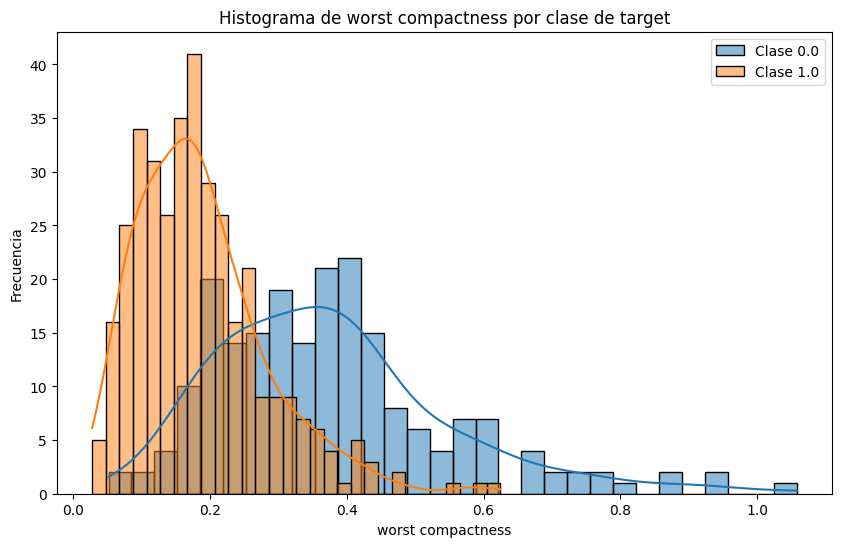

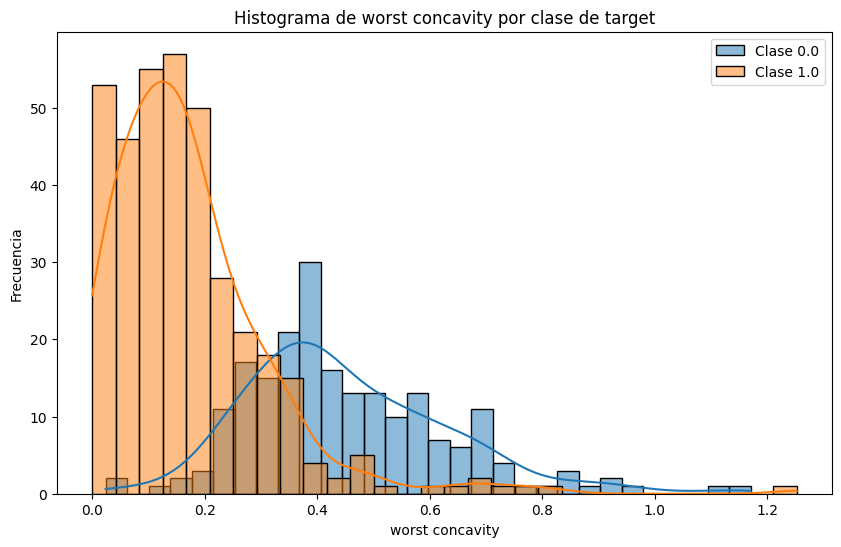

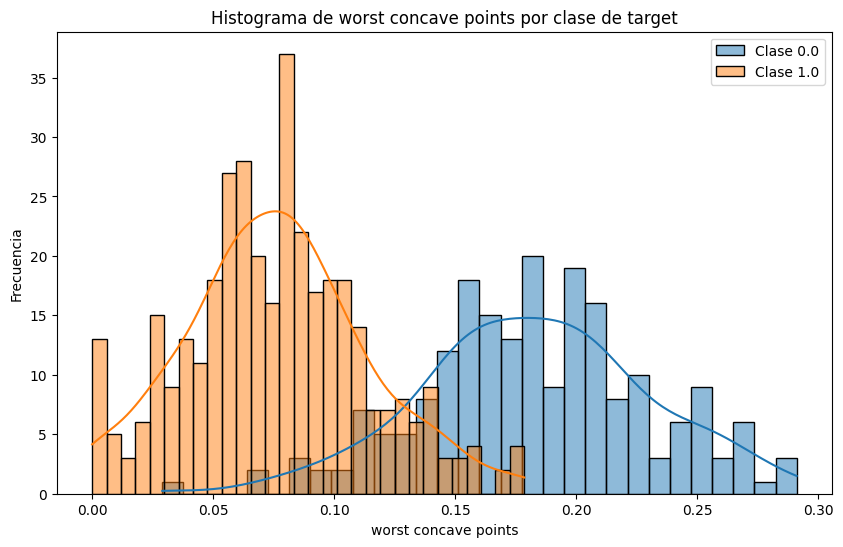

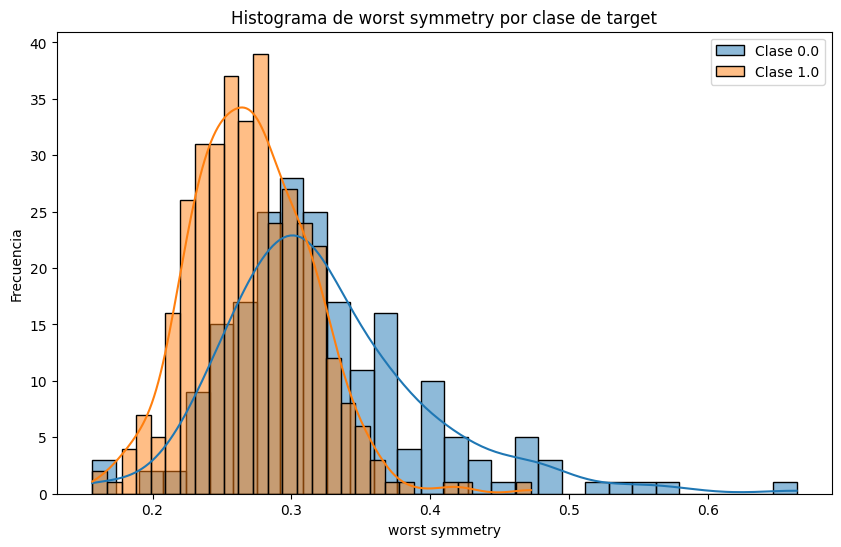

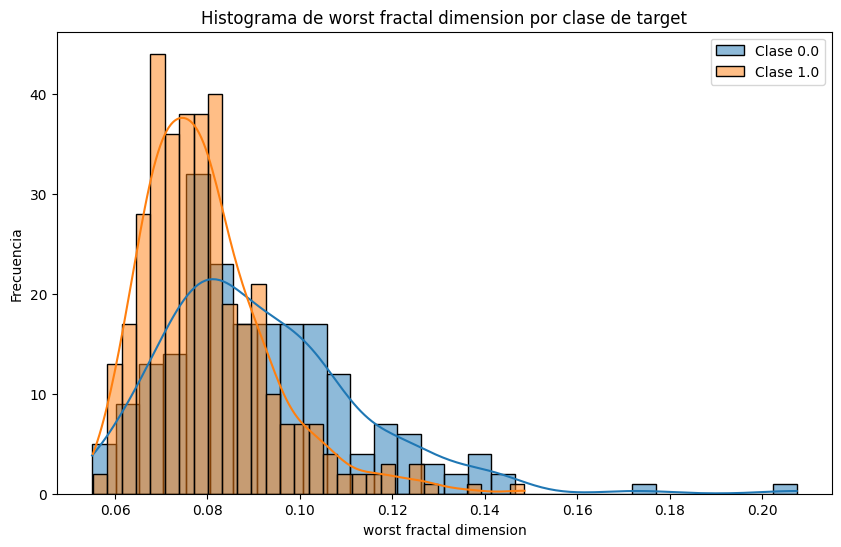

In [175]:
#(1P)
# 9. Gráficos y análisis de distribución de variables por clase. Histogramas.
# a. Construye una función que, dado un dataframe, una cadena con el nombre de una variable predictora y una cadena con la variable objetivo
#    muestre el histograma de la variable predictora para cada valor de clase.
def hist_por_clase(df, nombre_variable, nombre_objetivo):
    plt.figure(figsize=(10, 6))
    clases = df[nombre_objetivo].unique()
    for clase in clases:
        subset = df[df[nombre_objetivo] == clase]
        sns.histplot(subset[nombre_variable], bins=30, kde=True, label=f'Clase {clase}', alpha=0.5)
    plt.title(f'Histograma de {nombre_variable} por clase de {nombre_objetivo}')
    plt.xlabel(nombre_variable)
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.show()
# b. Utilizando esta función, muestra  -mediante un bucle for- todos los histogramas por clase, correspondientes a las variables predictoras.
for var in variables_predictoras:
    hist_por_clase(df, var, "target")
# c. Con base a las gráficas anteriores, ¿qué conclusiones puedes extraer?

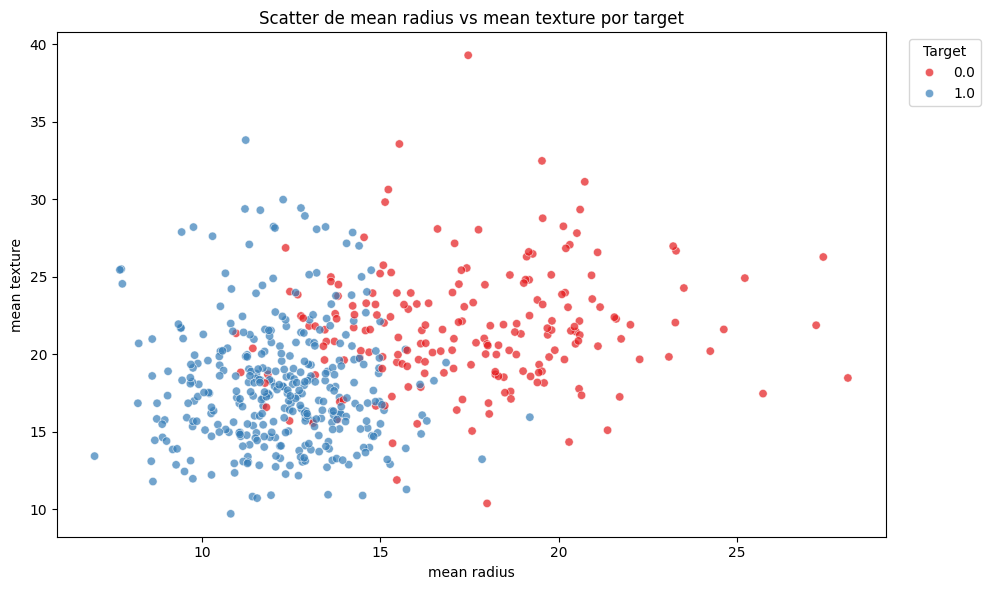

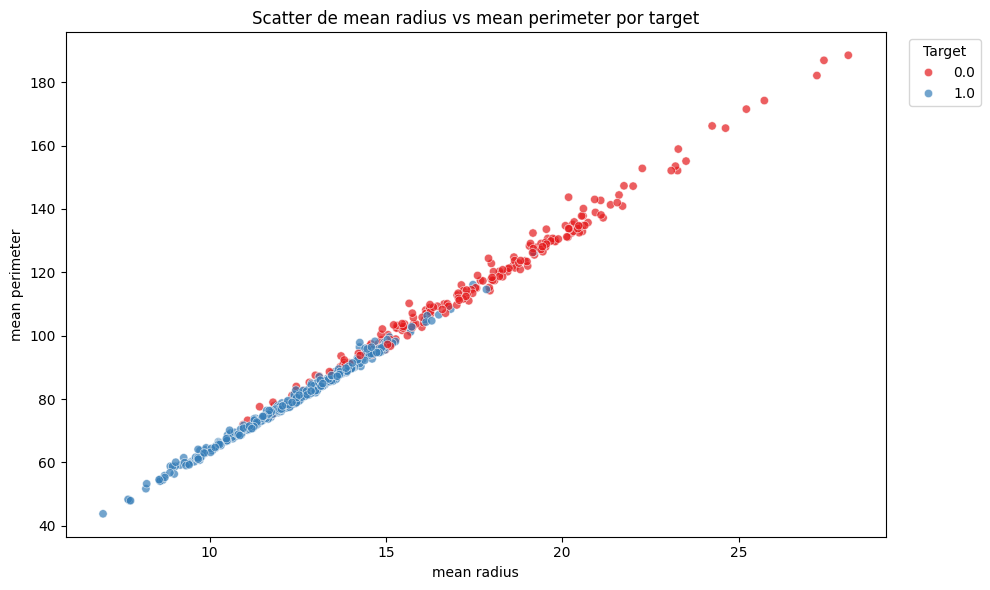

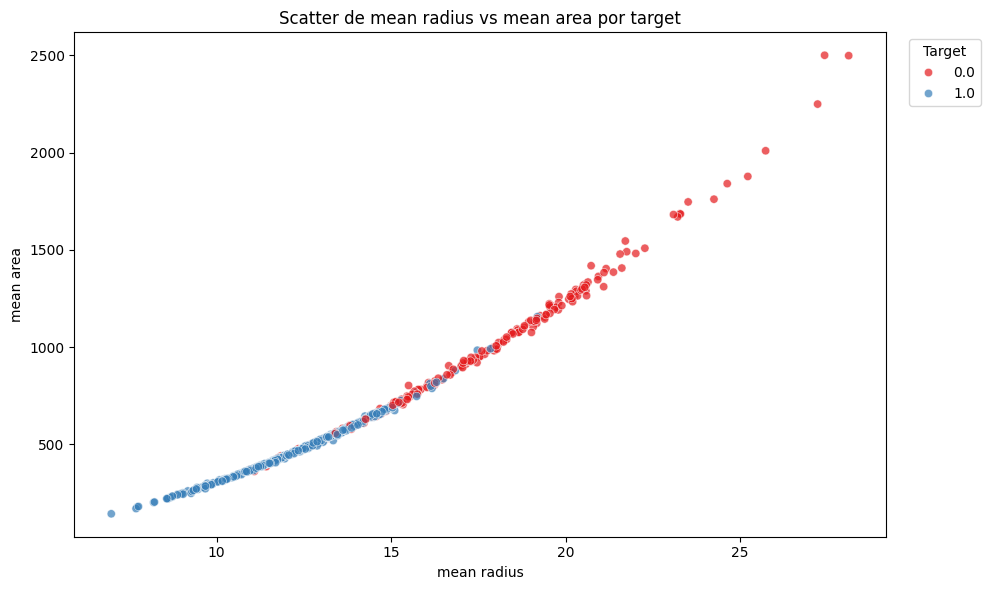

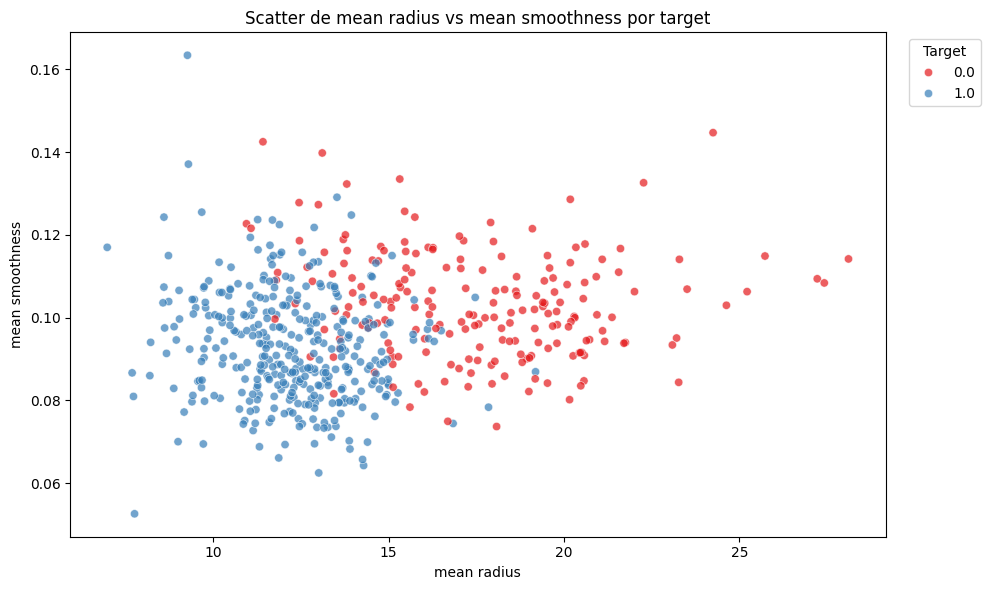

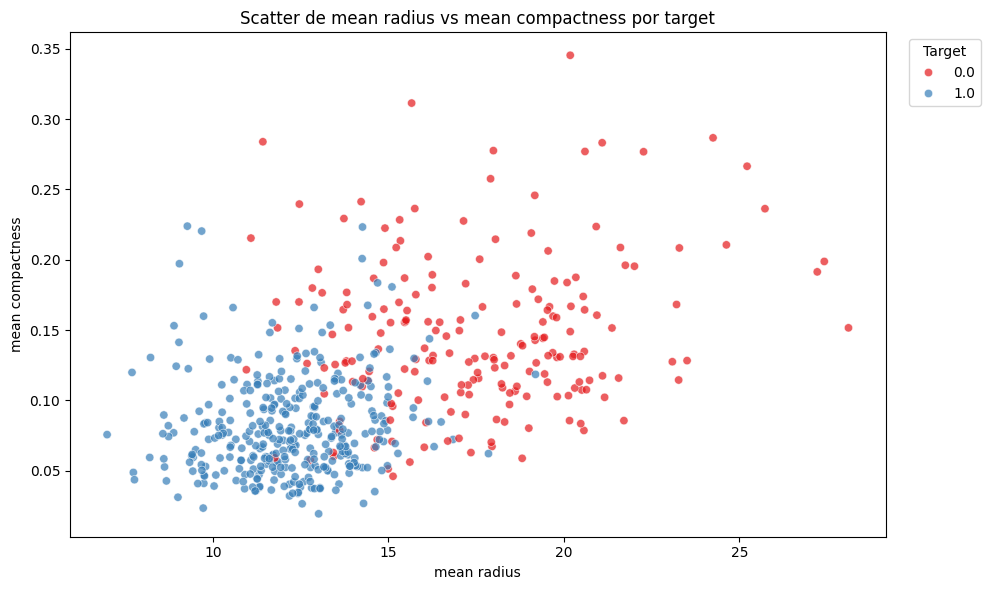

...

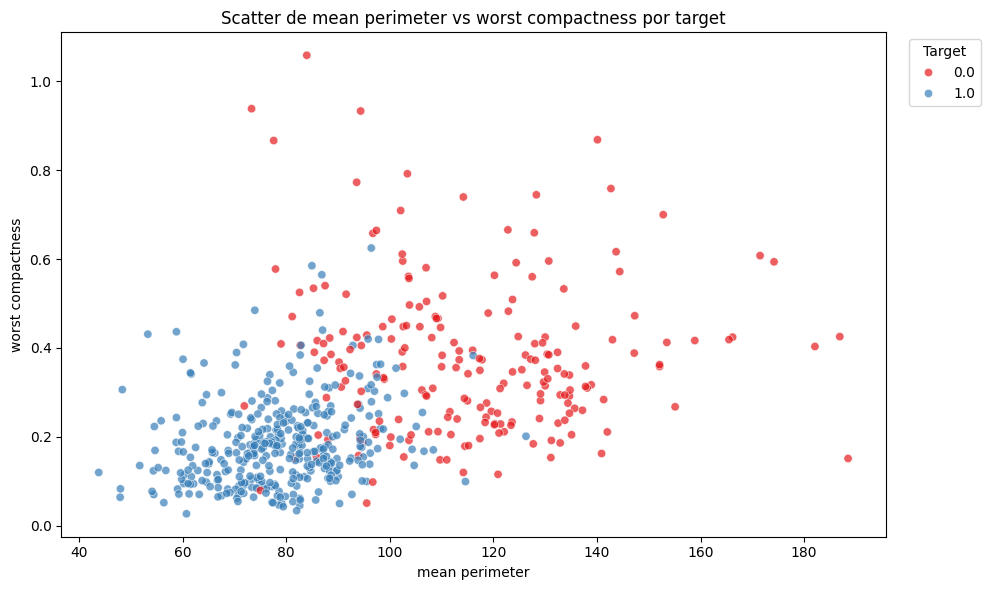

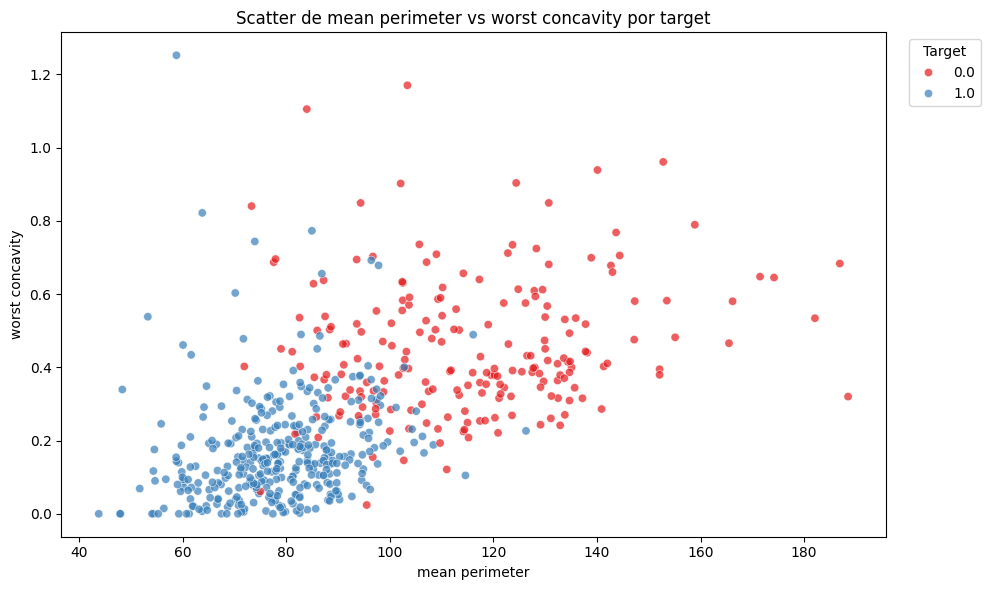

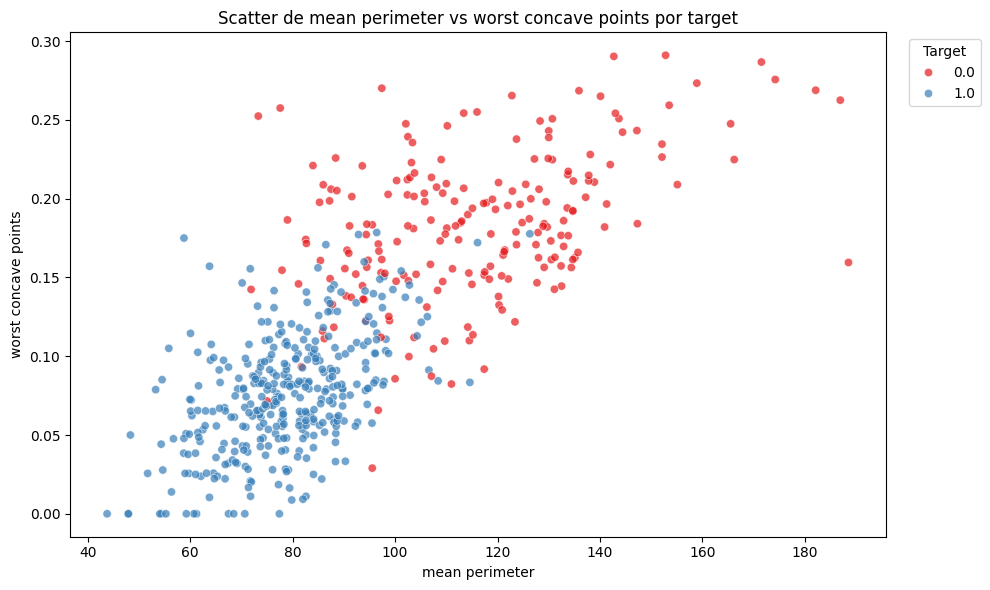

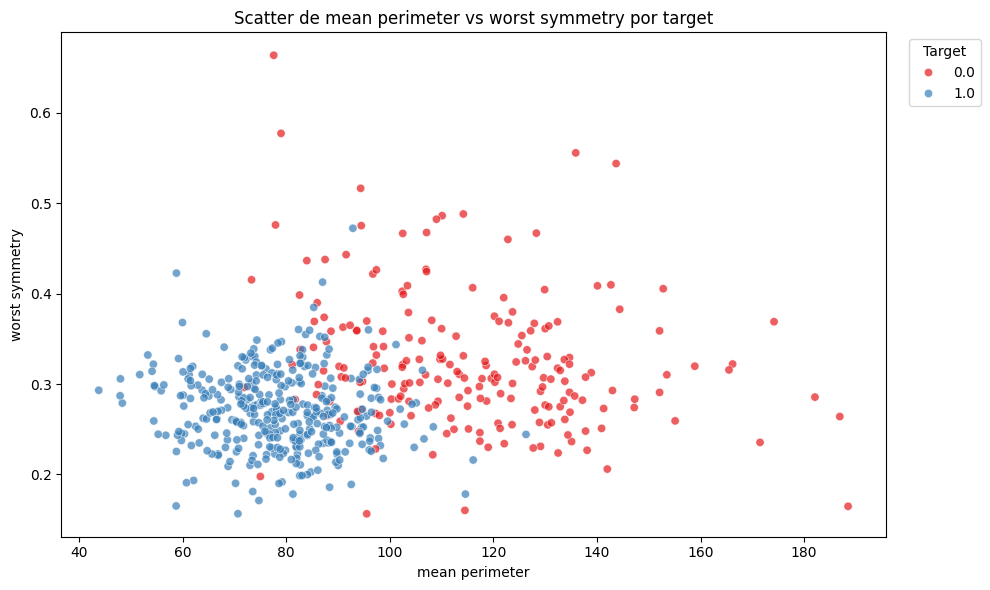

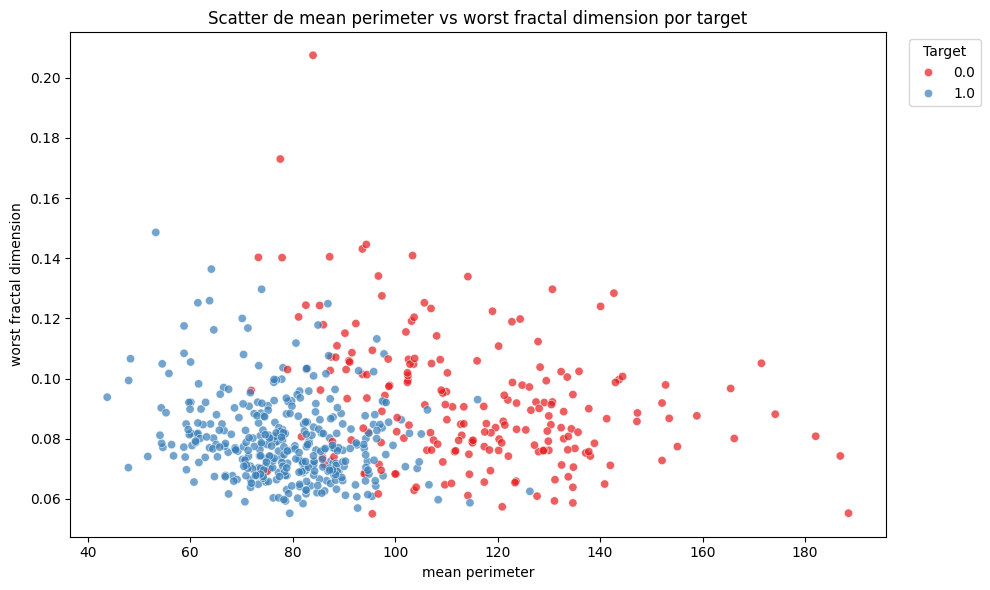

In [176]:
#(1P)
# 10. Gráficos y análisis de distribución de variables por clase. Scatter.
# a. Construye una función que, dado un dataframe, dos cadenas con dos nombres de dos variables predictoras y una cadena con la variable objetivo
#    muestre el scatter de las dos variables predictoras discriminadas por clase para cada valor de clase.
def plot_scatter_by_class(dataframe, var1, var2):
    plt.figure(figsize=(10, 6))
    ax = sns.scatterplot(
        data=dataframe,
        x=var1,
        y=var2,
        hue='target',
        palette='Set1',
        alpha=0.7
    )
    ax.set_title(f'Scatter de {var1} vs {var2} por target')
    ax.set_xlabel(var1)
    ax.set_ylabel(var2)
    handles, labels = ax.get_legend_handles_labels()
    if labels:                           
        ax.legend(title='Target', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
# b. Utilizando esta función, muestra  -mediante un bucle for- todos los scatters por clase, correspondientes a las variables predictoras.
for i in range(3):
    for j in range(i + 1, len(variables_predictoras)):
        plot_scatter_by_class(df, variables_predictoras[i], variables_predictoras[j])

# c. Con base a las gráficas anteriores, ¿qué conclusiones generales puedes extraer?

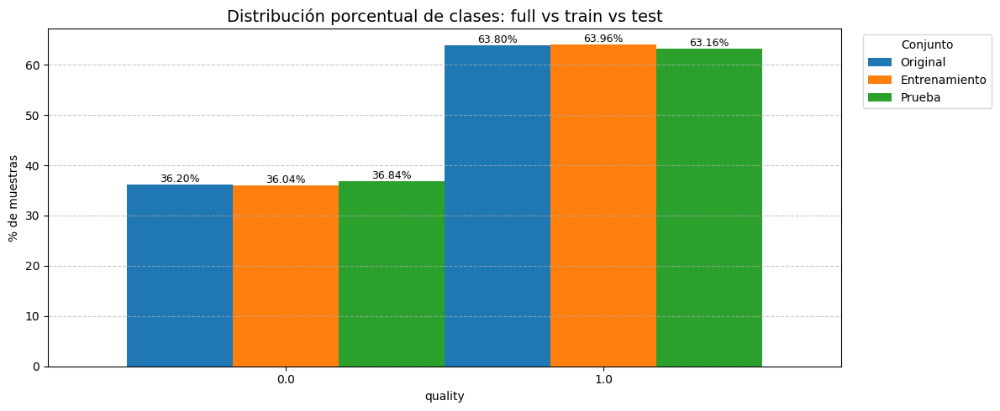

In [177]:
#(0,5P)
# 11. Conjunto de entrenamiento y prueba.
# a. Utiliza el objeto train_test_split y obtén los conjutos de entrenamiento y prueba con 80% y 20% para los conjuntos train y test, respectivamente.
X = df.drop(columns=['target'])
y = df['target']

X_train, X_test, y_train, y_test = train_test_split(
    X,                # Matriz de características de entrada (features)-atributos de entrada-variables predictoras
    y,                # Vector/serie con la variable objetivo (labels-eneste caso: class)
    test_size=0.2,    # Proporción para el conjunto de prueba y bel conjunto de entrenamiento: 20% test, 80% train
    random_state=42,  # Semilla para que la división sea reproducible
    shuffle=True      # Barajar aleatoriamente antes de dividir (recomendado si no hay una serie temporal)
)
# b. Muestra el gráfico de la distribución porcentual de clases en cada conjunto de datos (celda 18, práctica2), ¿qué conclusiones puedes extraer?
# Asegurar orden de clases
classes = sorted(df['target'].unique())

# Definir dist usando y, y_train, y_test (porcentajes redondeados)
dist = pd.DataFrame({
    'Original':      (y.value_counts(normalize=True) * 100).round(2),
    'Entrenamiento': (y_train.value_counts(normalize=True) * 100).round(2),
    'Prueba':        (y_test.value_counts(normalize=True) * 100).round(2)
}).reindex(classes)  # índice = clases en orden


# Graficar: cada índice (clase) en el eje x y 3 barras por clase
ax = dist.plot(kind='bar', figsize=(12,5), rot=0, color=['tab:blue','tab:orange','tab:green'], width=1)

# Personalización
ax.set_title('Distribución porcentual de clases: full vs train vs test', fontsize=14)
ax.set_xlabel('quality')
ax.set_ylabel('% de muestras')
ax.legend(title='Conjunto', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Etiquetas sobre cada barra
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f%%', label_type='edge', fontsize=9)

plt.tight_layout()
plt.show()

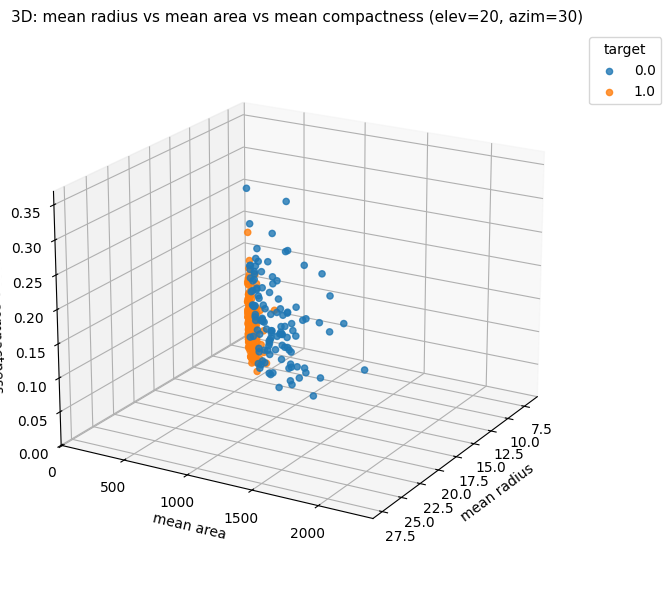

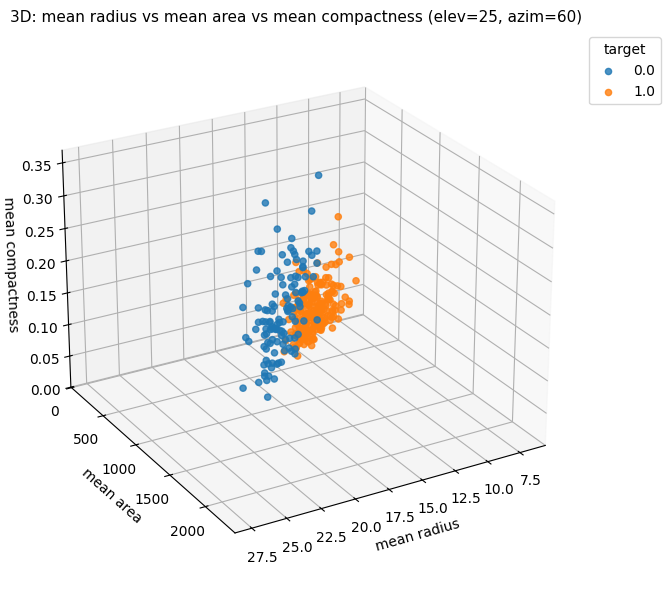

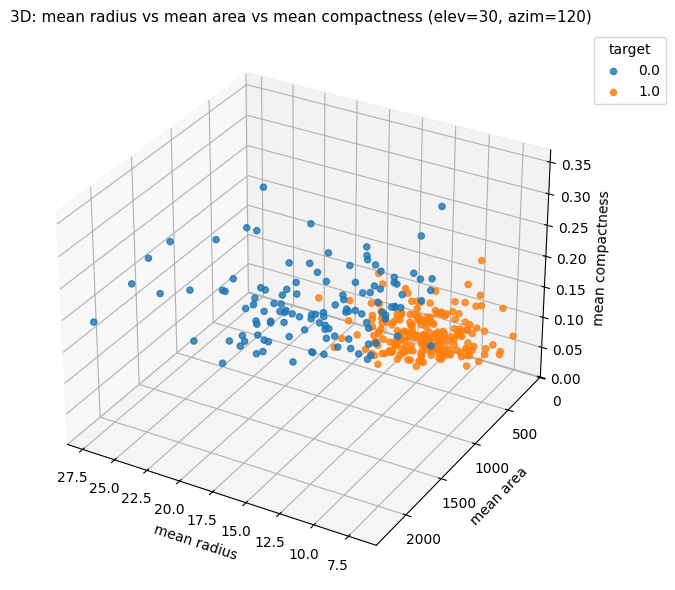

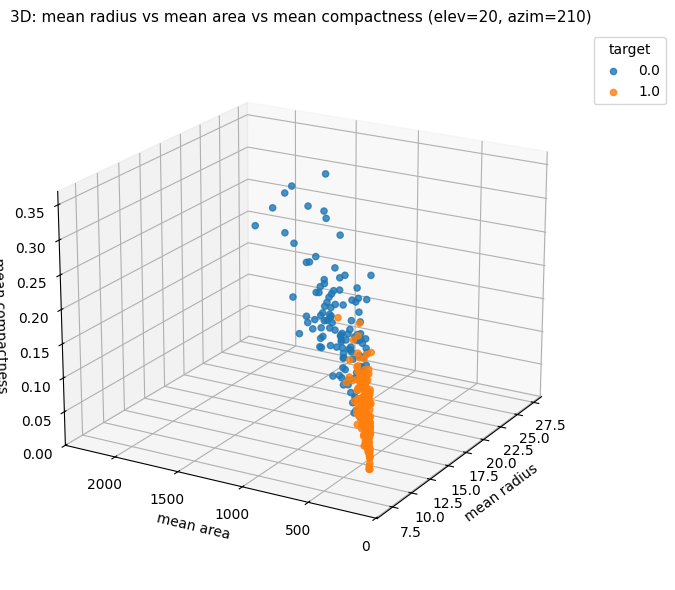

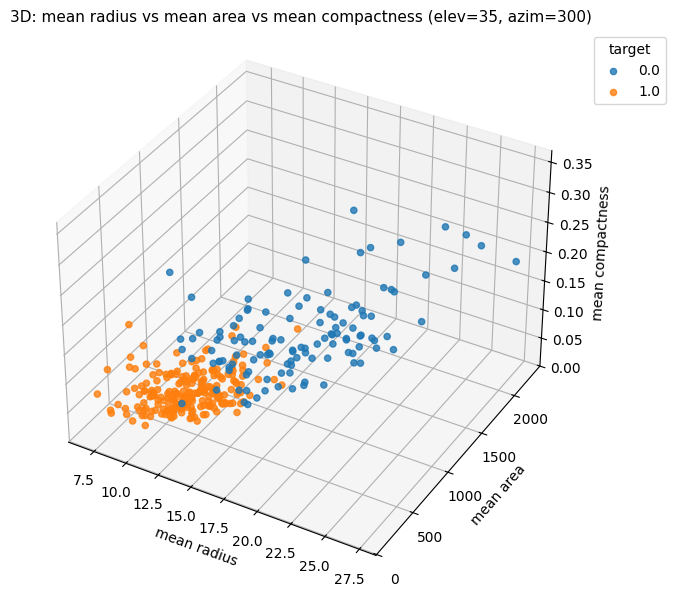

In [178]:
#(0,5P)
# 12. Gráfico 3D
# a. Elige tres variables predictoras originales, represéntalas desde diferentes ángulos (5 combinaciones de azimut y altura).
# Haz esta representación mediante el uso iterativo de una función que acepte un dataframe, tres cadenas de caracteres
# cada una de las cuales contenga el nombre de una variable predictora, un valor de azimut y un valor de altura.
def grafico_3d(df, x_var, y_var, z_var, elev=20, azim=30, sample_frac=1.0):
    """
    Dibuja un scatter 3D de tres variables numéricas coloreado por 'target'.
    elev: elevación, azim: azimut.
    """
    dfp = df.sample(frac=sample_frac, random_state=42) if sample_frac < 1 else df
    classes = sorted(dfp['target'].unique())
    colors = sns.color_palette('tab10', n_colors=len(classes))

    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(111, projection='3d')
    for idx, cls in enumerate(classes):
        sub = dfp[dfp['target'] == cls]
        ax.scatter3D(sub[x_var], sub[y_var], sub[z_var],
                     color=colors[idx], alpha=0.8, s=20, label=str(cls))
    ax.set_title(f'3D: {x_var} vs {y_var} vs {z_var} (elev={elev}, azim={azim})', fontsize=11)
    ax.set_xlabel(x_var)
    ax.set_ylabel(y_var)
    ax.set_zlabel(z_var)
    ax.view_init(elev=elev, azim=azim)
    ax.legend(title='target', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Generar 5 vistas con las variables elegidas
vars_3d = ('mean radius', 'mean area', 'mean compactness')
vistas = [(30,20), (60,25), (120,30), (210,20), (300,35)]
for azim, elev in vistas:
    grafico_3d(df, *vars_3d, elev=elev, azim=azim, sample_frac=0.6)
# b. En base a la visualización anterior, extrae las conclusiones pertinentes.

<Figure size 1200x800 with 0 Axes>

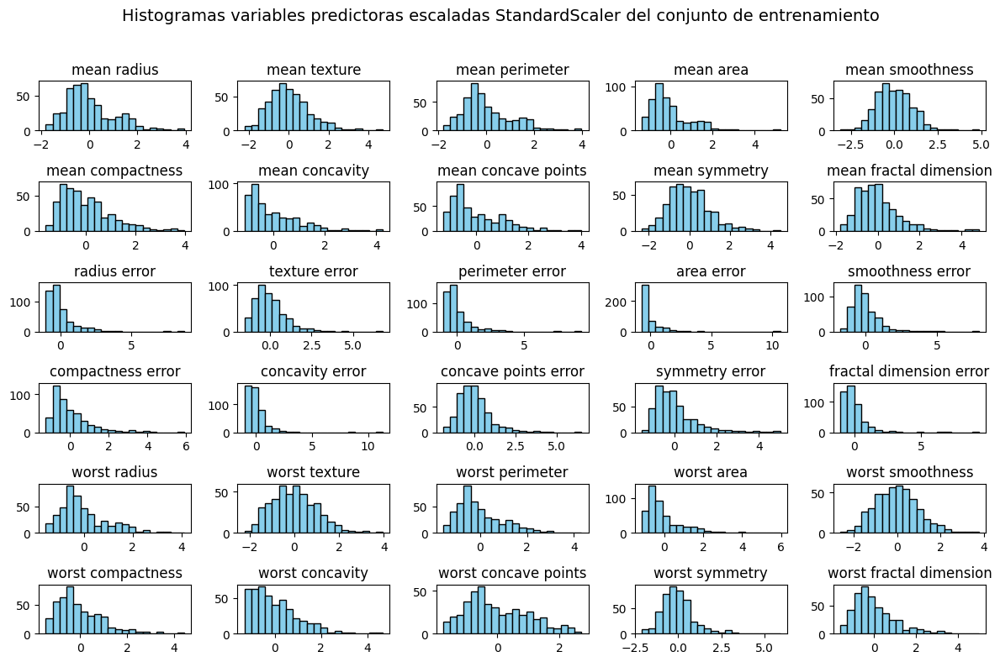

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,4.460000e+02,4.460000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,...,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02,4.550000e+02
mean,-5.934466e-16,1.244645e-16,-1.132183e-16,3.669836e-16,-2.381489e-16,-4.294489e-17,-5.953723e-17,2.225326e-16,1.444510e-16,5.055785e-16,...,-7.027346e-17,-6.754060e-16,-2.928061e-17,1.815398e-16,-1.561632e-17,-2.249727e-16,-7.612958e-17,-8.198570e-17,5.153387e-16,2.147245e-17
std,1.001123e+00,1.001123e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,...,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00,1.001101e+00
min,-1.810886e+00,-2.229463e+00,-1.809497e+00,-1.365036e+00,-3.100011e+00,-1.607228e+00,-1.119899e+00,-1.269910e+00,-2.345430e+00,-1.776889e+00,...,-1.572438e+00,-2.230887e+00,-1.578174e+00,-1.152259e+00,-2.617938e+00,-1.455995e+00,-1.312795e+00,-1.749805e+00,-2.124261e+00,-1.616973e+00
25%,-6.840221e-01,-7.054485e-01,-6.907613e-01,-6.602049e-01,-7.132037e-01,-7.770872e-01,-7.505387e-01,-7.349048e-01,-7.010461e-01,-7.097920e-01,...,-6.616975e-01,-7.412292e-01,-6.853483e-01,-6.358132e-01,-7.430298e-01,-6.961323e-01,-7.555873e-01,-7.700987e-01,-6.499846e-01,-7.189616e-01
50%,-2.102127e-01,-1.142158e-01,-2.429378e-01,-2.895973e-01,-8.082013e-02,-2.413402e-01,-3.446456e-01,-3.911235e-01,-6.915087e-02,-1.772851e-01,...,-2.632354e-01,-5.210786e-02,-2.829543e-01,-3.357508e-01,-2.741590e-02,-2.753858e-01,-2.304110e-01,-2.386392e-01,-1.236838e-01,-2.135847e-01
75%,4.586120e-01,5.682929e-01,4.884799e-01,3.193386e-01,6.331729e-01,5.281282e-01,5.473870e-01,6.737569e-01,5.354290e-01,4.642225e-01,...,4.525400e-01,6.857059e-01,5.263332e-01,2.724862e-01,6.296478e-01,5.738568e-01,5.383496e-01,7.189995e-01,4.319440e-01,4.600643e-01
max,3.939316e+00,4.735777e+00,3.976811e+00,5.208312e+00,4.864642e+00,3.964311e+00,4.256736e+00,4.022271e+00,4.476124e+00,4.815921e+00,...,4.120889e+00,3.962127e+00,4.322305e+00,5.955420e+00,3.767506e+00,4.424833e+00,4.672828e+00,2.709674e+00,5.917679e+00,4.999482e+00


In [180]:
#(0,5P)
# 13. Escalado del Dataset.
# a. Realiza el estandarizado de los conjuntos de entrenamiento y test, utilizando el objeto StandardScaler.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# b. Muestra los histogramas del conjunto de entrenamiento escalado. Verifica que son coherentes con el proceso de estandarización previo.
X_train_scaled = pd.DataFrame(
    X_train_scaled,            # datos estandarizados (array)
    columns=X_train.columns,  # nombres de columnas originales
    index=X_train.index       # índices originales (opcional pero recomendable)
)
plt.figure(figsize=(12, 8))              # Define el tamaño de la figura (ancho x alto en pulgadas)
X_train_scaled.hist(bins=20,                # Define el número de barras (bins) del histograma
        color='skyblue',                 # Asigna un color azul claro a las barras
        edgecolor='black',               # Agrega un borde negro a cada barra para mejor visibilidad
        grid=False,                      # Elimina las cuadrículas internas para un diseño más limpio
        figsize=(12, 8))                 # Tamaño del gráfico para todos los histogramas

plt.suptitle('Histogramas variables predictoras escaladas StandardScaler del conjunto de entrenamiento', 
             fontsize=14)                # Agrega un título general a todos los subgráficos
plt.tight_layout(rect=[0, 0, 1, 0.96])   # Ajusta el espaciado entre gráficos y deja espacio para el título
plt.show() 
# c. Realiza un describe() de este conjunto, verifica que la media y desviación típica de la salida es coherente
#    con el proceso de estandarización previo. 
df_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
display(df_train_scaled.describe())

In [188]:
# (1P)
# 14. PCA (Análisis de Componentes Principales)
# a. Instancia un objeto PCA con 4 componentes principales.
pca = PCA(n_components=4)
# b. Entrena y transforma X_train. Transforma X_test.
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)
# c. Escribe las ecuaciones de transformación de los componentes principales en función de las variables predictoras del dataset original.
    
# d. Calcula un array que represente la proporción de varianza total del dataset que explica cada componente principal.
# e. Muestra una gráfica en la que se represente la varianza explicada y la varianza acumulada por cada componente principal (celda 30, práctica2).
# Con cuántas variable puedes obtener un resultado óptimo? Explica tu respuesta.

ValueError: Input X contains NaN.
PCA does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

# C) PC1 = num * mean radius + num * mean texture ...